Choose the class you would like the image to be generated from. For ex, you could choose to produce only images of t-shirts. The noise together with the target will be passed to the generator. The noise will intorduce randomness to the generated image. For ex, in case of t-shirts, the different noises passed to the generator will produce different types of t-shirts.

The images together with target will be passed to the discriminator and the discriminator will predict the probability the image belong to the particular target. The target is passed as channels to the discriminator. If there are 10 different classes, there will be 10 different channels and each channel will have the values of 0 except the target class channel which will have the value of 1. 

In [1]:
import torch
import torchvision
from torch import nn
from torch.autograd import Variable
import torch.nn.functional as F
from torchvision import transforms
from torchvision.datasets import FashionMNIST
from torch.utils.data import DataLoader
from torchvision.utils import save_image
import numpy as np
import os

In [2]:
class Generator(nn.Module):
    def __init__(self, z_dim = 110, img_channels = 1, hidden_dim = 64):
        super(Generator, self).__init__()
        
        self.z_dim = z_dim
        self.emb = nn.Embedding(10, 10)
        
        self.gen = nn.Sequential(
            self.gen_block(z_dim, hidden_dim*16, 4, 1, 0),
            self.gen_block(hidden_dim*16, hidden_dim*8, 4, 2, 1),
            self.gen_block(hidden_dim*8, hidden_dim*4, 4, 2, 1),
            self.gen_block(hidden_dim*4, hidden_dim*2, 4, 2, 1),
            nn.ConvTranspose2d(hidden_dim*2, 1, kernel_size = 4, stride = 2, padding = 1),
            nn.Tanh()
        )
    
    def gen_block(self, input_channels, output_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride, padding, bias = False),
            nn.BatchNorm2d(output_channels),
            nn.ReLU()
        )
    
    def forward(self, noise, labels):
        embedding = self.emb(labels)
        embedding_noise = torch.cat((noise, embedding), 1)
        embedding_noise = embedding_noise.view(len(noise), self.z_dim, 1, 1)
        img = self.gen(embedding_noise)
        return img.view(img.size(0), 1, 64, 64)

In [3]:
def get_noise(n_samples, z_dim):
    return torch.randn(n_samples, z_dim).to('cuda')

In [4]:
class Discriminator(nn.Module):
    def __init__(self, img_channel = 2, hidden_dim = 64):
        super(Discriminator, self).__init__()
        
        self.emb = nn.Embedding(10, 10)
        self.linear = nn.Linear(10, 64*64)
        
        self.disc = nn.Sequential(
            nn.Conv2d(img_channel, hidden_dim, kernel_size = 4, stride = 2, padding = 1),
            nn.LeakyReLU(0.2),
            self.disc_block(hidden_dim, hidden_dim*2, 4, 2, 1),
            self.disc_block(hidden_dim*2, hidden_dim*4, 4, 2, 1),
            self.disc_block(hidden_dim*4, hidden_dim*8, 4, 2, 1),
            nn.Conv2d(hidden_dim*8, 1, kernel_size = 4, stride = 2, padding = 0),    
        )
        
    def disc_block(self, input_channels, output_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size, stride, padding, bias = False),
            nn.BatchNorm2d(output_channels),
            nn.LeakyReLU(0.2),
        )
    
    def forward(self, img, labels):
        embedding = self.emb(labels)
        linear_l = self.linear(embedding)
        linear_l = linear_l.view(len(labels), 1, 64, 64)
        embedding_img = torch.cat((img, linear_l), 1)
        return self.disc(embedding_img)
        

In [5]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02),
        torch.nn.init.normal_(m.bias, 0)

In [6]:
def create_labels(labels, n_classes, noise_v):
    labels_ohe = F.one_hot(labels, n_classes)
    noise_labels = torch.cat((noise_v.float(), labels_ohe.float()), 1)
    return noise_labels

In [7]:
n_epochs = 100
steps = 100
z_dim = 100
batch_size = 128
beta_1 = 0.5
beta_2 = 0.999
lr = 0.0002
image_size = 64
device = 'cuda'
criterion = nn.BCEWithLogitsLoss()

transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5), (0.5))
])

dataloader = DataLoader(
    FashionMNIST(".", download = False, transform = transform),
    batch_size = batch_size,
    shuffle = True
)

In [8]:
gen = Generator().to(device)
disc = Discriminator().to(device)

weights_init(gen)
weights_init(disc)

gen_opt = torch.optim.Adam(gen.parameters(), lr = lr, betas = (beta_1, beta_2))
disc_opt = torch.optim.Adam(disc.parameters(), lr = lr, betas = (beta_1, beta_2))

In [9]:
import numpy as np
import matplotlib.pyplot as plt

def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize
    img = img.detach().cpu()
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

Epochs: 0 Step: 100 Generator loss: 1.3733550357818602, discriminator loss: 0.6197387686371804


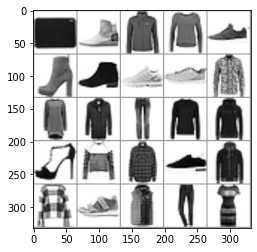

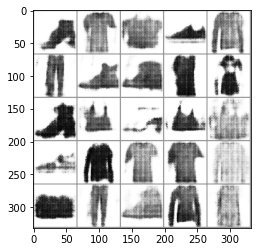

Epochs: 0 Step: 200 Generator loss: 1.337007048726082, discriminator loss: 0.620694316625595


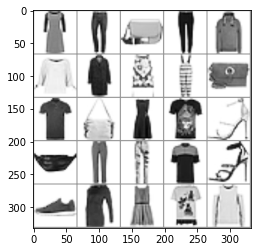

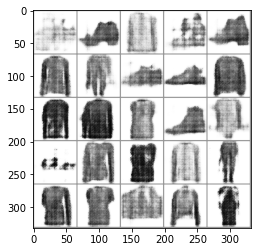

Epochs: 0 Step: 300 Generator loss: 1.8186734521389007, discriminator loss: 0.5573802457749844


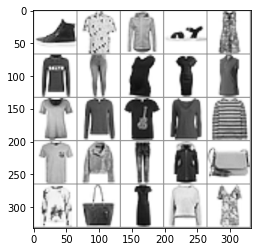

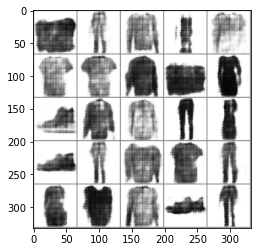

Epochs: 0 Step: 400 Generator loss: 1.7355151569843292, discriminator loss: 0.5572878240048885


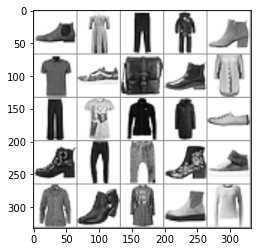

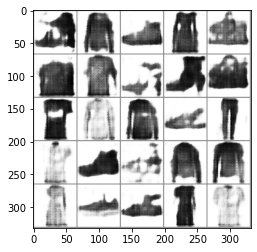

Epochs: 1 Step: 500 Generator loss: 2.5180153572559356, discriminator loss: 0.3815013287961483


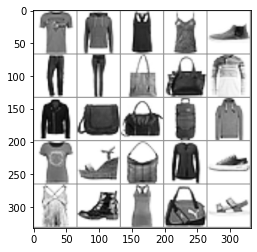

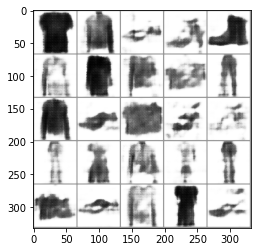

Epochs: 1 Step: 600 Generator loss: 2.7349851578474045, discriminator loss: 0.3573437514901161


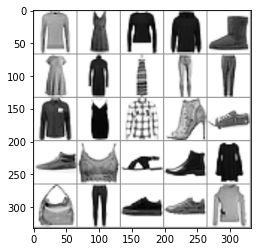

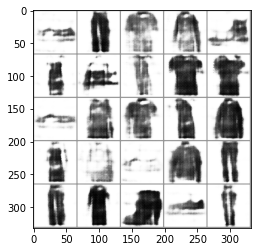

Epochs: 1 Step: 700 Generator loss: 2.3330573469400404, discriminator loss: 0.4678549595177174


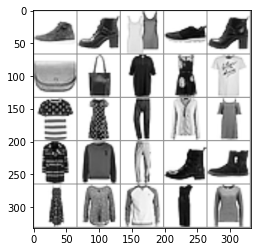

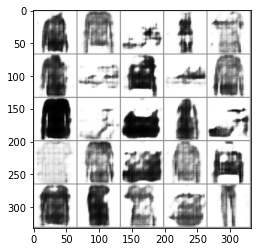

Epochs: 1 Step: 800 Generator loss: 1.5269710820913316, discriminator loss: 0.5242738711833954


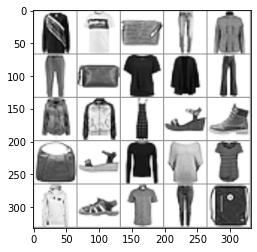

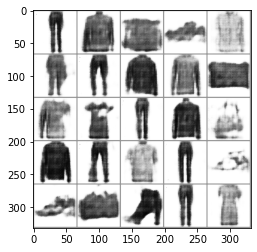

Epochs: 1 Step: 900 Generator loss: 1.6548407417535782, discriminator loss: 0.5163074266910553


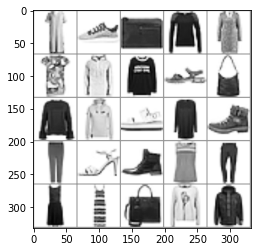

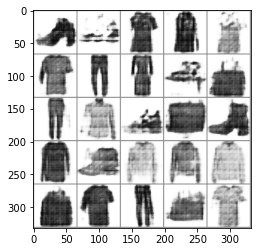

Epochs: 2 Step: 1000 Generator loss: 2.3182065683603286, discriminator loss: 0.3822727502882481


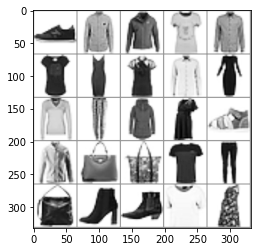

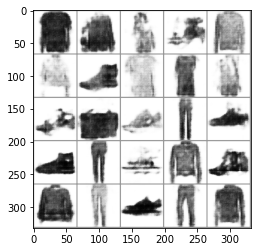

Epochs: 2 Step: 1100 Generator loss: 1.973443604707718, discriminator loss: 0.4449850997328758


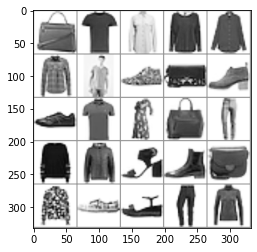

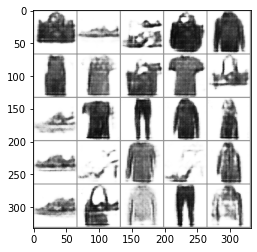

Epochs: 2 Step: 1200 Generator loss: 2.8740466356277468, discriminator loss: 0.32327235754579303


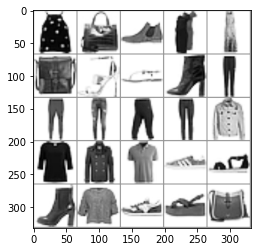

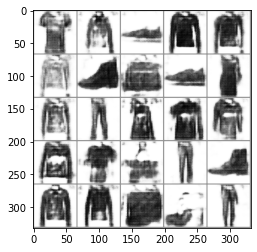

Epochs: 2 Step: 1300 Generator loss: 2.924086468219757, discriminator loss: 0.30167635215446353


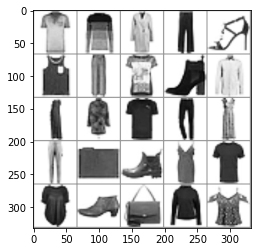

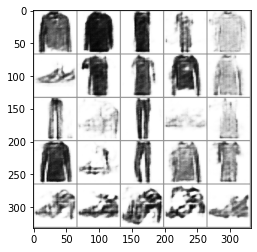

Epochs: 2 Step: 1400 Generator loss: 3.0042891530692577, discriminator loss: 0.3070990659855306


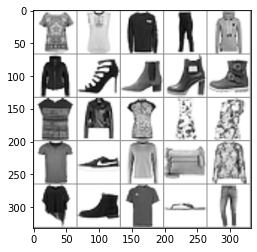

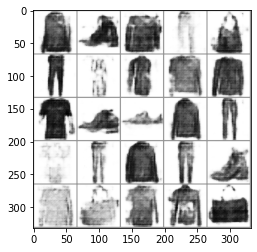

Epochs: 3 Step: 1500 Generator loss: 2.406646892428398, discriminator loss: 0.3709759049117565


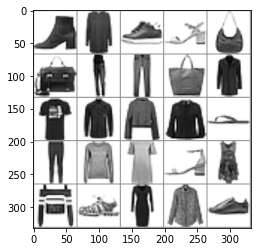

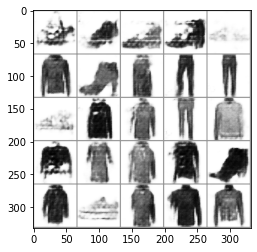

Epochs: 3 Step: 1600 Generator loss: 3.2429201233386995, discriminator loss: 0.20153363334015012


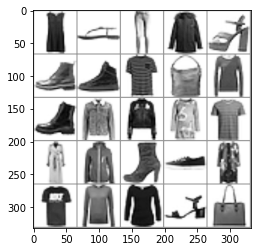

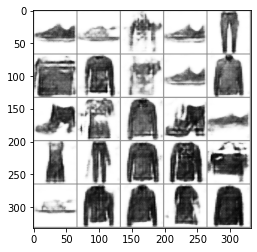

Epochs: 3 Step: 1700 Generator loss: 2.242230519875884, discriminator loss: 0.4784600622393191


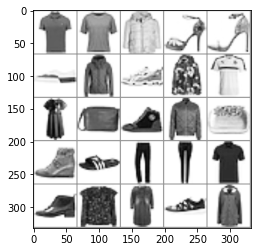

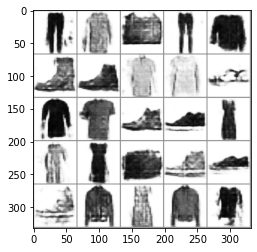

Epochs: 3 Step: 1800 Generator loss: 2.317028329372406, discriminator loss: 0.3975462472438812


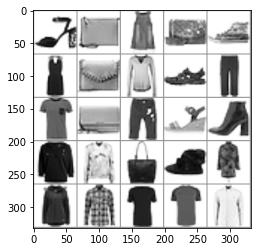

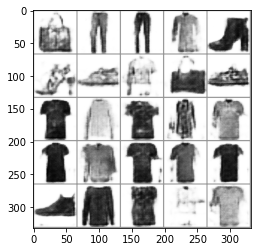

Epochs: 4 Step: 1900 Generator loss: 3.0824897265434266, discriminator loss: 0.259643675647676


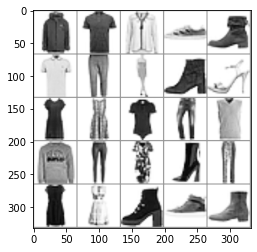

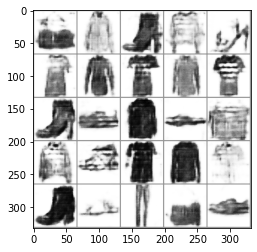

Epochs: 4 Step: 2000 Generator loss: 2.8175576359033583, discriminator loss: 0.305172830298543


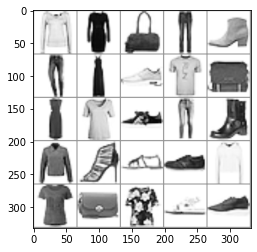

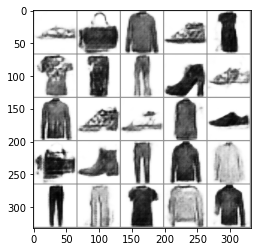

Epochs: 4 Step: 2100 Generator loss: 3.736690864562988, discriminator loss: 0.07600897002965212


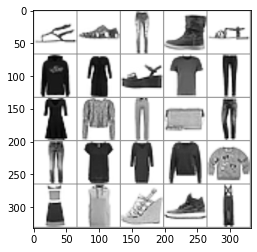

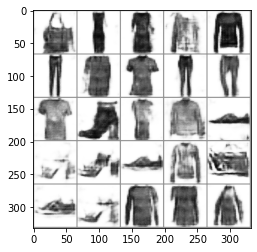

Epochs: 4 Step: 2200 Generator loss: 2.4384549671411513, discriminator loss: 0.4532486771047115


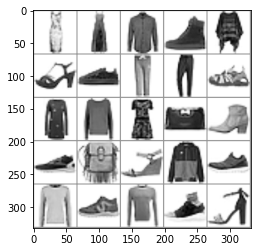

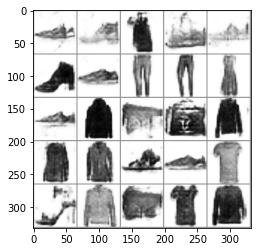

Epochs: 4 Step: 2300 Generator loss: 2.8357688289880754, discriminator loss: 0.33314597301185134


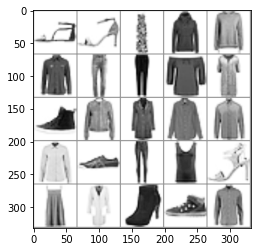

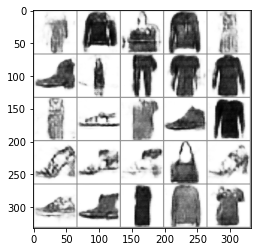

Epochs: 5 Step: 2400 Generator loss: 3.3725750562548638, discriminator loss: 0.23057104913517834


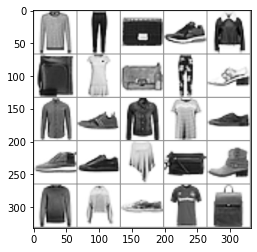

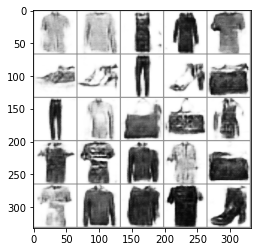

Epochs: 5 Step: 2500 Generator loss: 3.806128135919571, discriminator loss: 0.16597982143983245


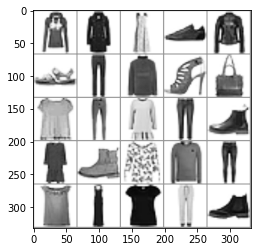

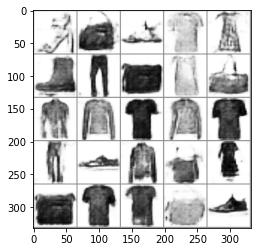

Epochs: 5 Step: 2600 Generator loss: 3.1471114379167555, discriminator loss: 0.24845027849078177


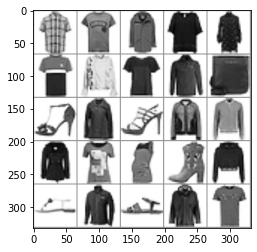

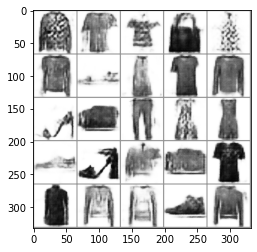

Epochs: 5 Step: 2700 Generator loss: 3.1385951864719392, discriminator loss: 0.266936060898006


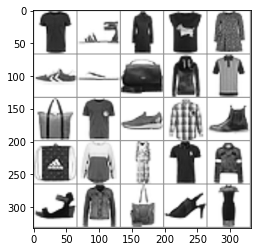

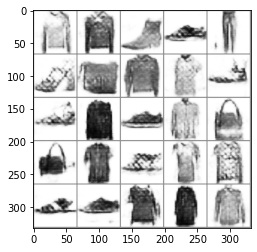

Epochs: 5 Step: 2800 Generator loss: 2.770931366086006, discriminator loss: 0.29843814492225645


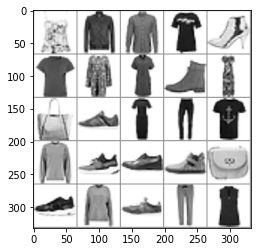

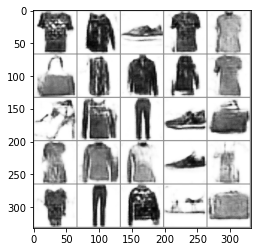

Epochs: 6 Step: 2900 Generator loss: 3.639870421886444, discriminator loss: 0.18176448710262774


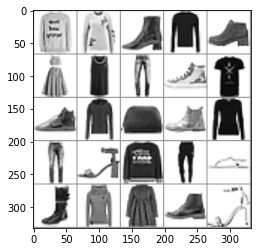

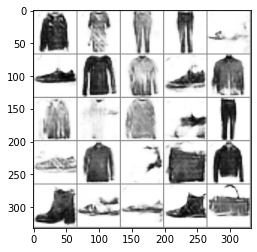

Epochs: 6 Step: 3000 Generator loss: 3.4095858150720595, discriminator loss: 0.18006937619298696


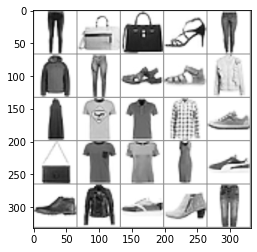

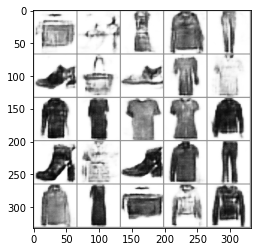

Epochs: 6 Step: 3100 Generator loss: 3.5957280920445918, discriminator loss: 0.22460969891399146


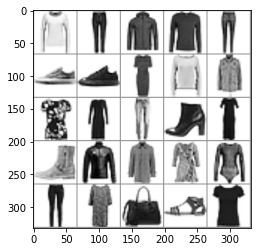

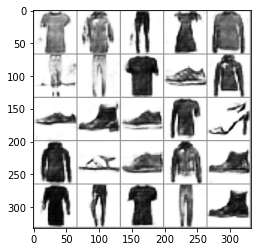

Epochs: 6 Step: 3200 Generator loss: 3.4044151126407085, discriminator loss: 0.20236515702679753


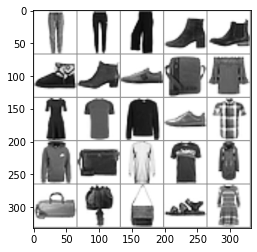

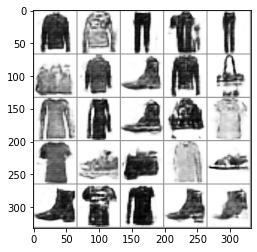

Epochs: 7 Step: 3300 Generator loss: 2.81386924803257, discriminator loss: 0.33070636868476866


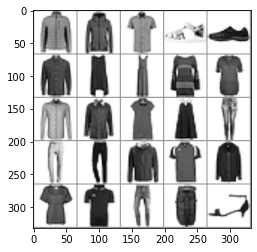

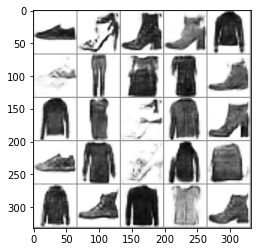

Epochs: 7 Step: 3400 Generator loss: 3.588749113455415, discriminator loss: 0.21646606491878628


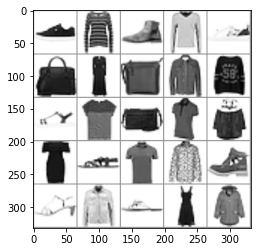

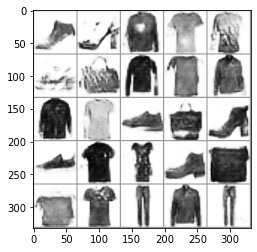

Epochs: 7 Step: 3500 Generator loss: 3.0886737275123597, discriminator loss: 0.22914351716637613


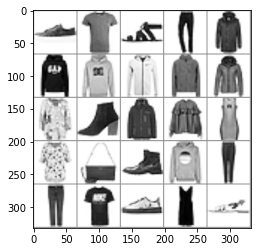

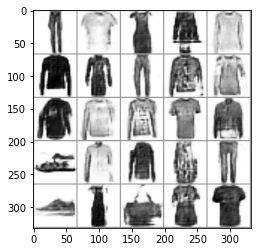

Epochs: 7 Step: 3600 Generator loss: 3.983989080190659, discriminator loss: 0.1582506270520389


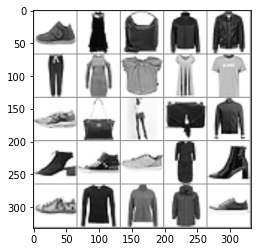

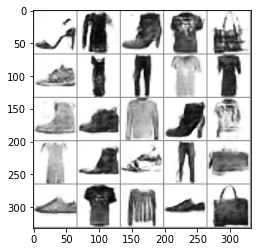

Epochs: 7 Step: 3700 Generator loss: 3.5981981447339058, discriminator loss: 0.17847662145271898


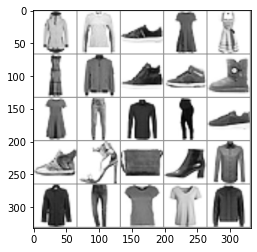

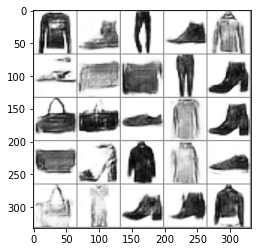

Epochs: 8 Step: 3800 Generator loss: 3.946116256713867, discriminator loss: 0.23791643938049675


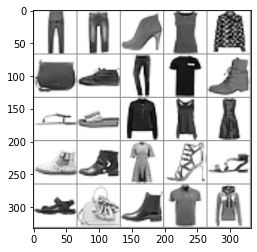

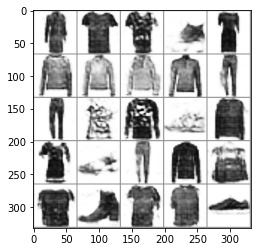

Epochs: 8 Step: 3900 Generator loss: 3.5872060322761534, discriminator loss: 0.14343848135322332


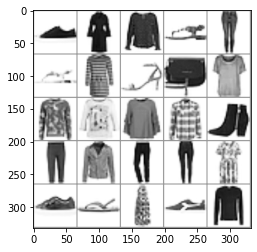

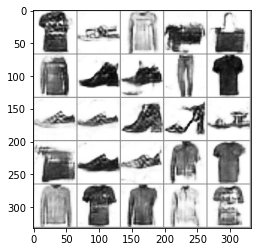

Epochs: 8 Step: 4000 Generator loss: 4.217015388011933, discriminator loss: 0.1999857610836625


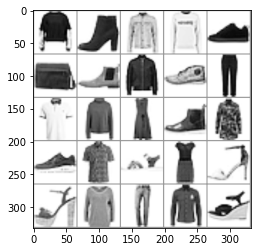

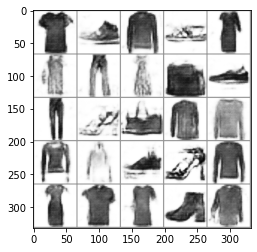

Epochs: 8 Step: 4100 Generator loss: 3.448188762664795, discriminator loss: 0.19512968227267266


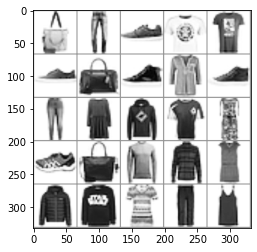

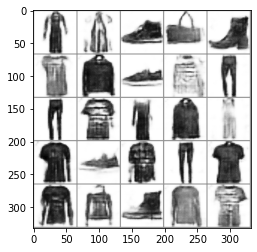

Epochs: 8 Step: 4200 Generator loss: 4.5837430167198185, discriminator loss: 0.05653784135356545


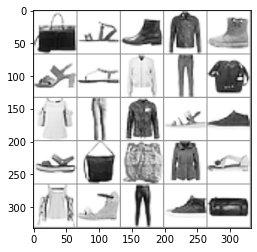

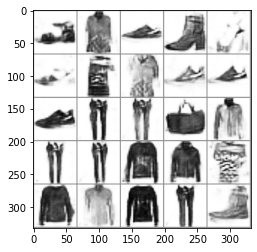

Epochs: 9 Step: 4300 Generator loss: 2.6387215922027827, discriminator loss: 0.3924625790119171


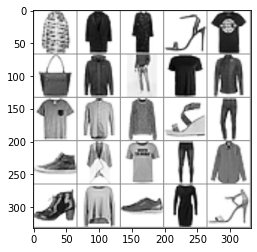

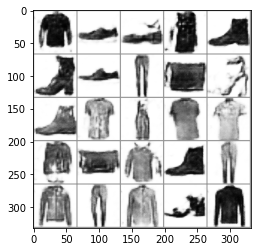

Epochs: 9 Step: 4400 Generator loss: 3.0855199575424193, discriminator loss: 0.2618615780770779


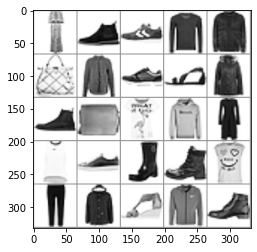

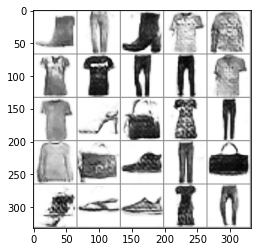

Epochs: 9 Step: 4500 Generator loss: 4.475255916118622, discriminator loss: 0.04514334667474031


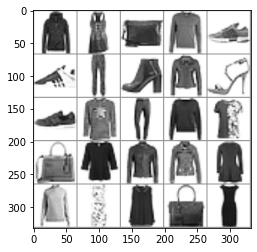

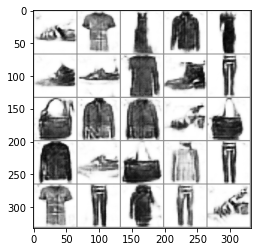

Epochs: 9 Step: 4600 Generator loss: 4.019628335237503, discriminator loss: 0.2753741380013526


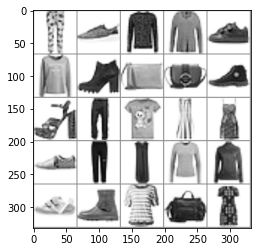

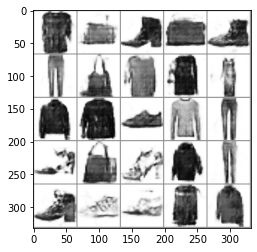

Epochs: 10 Step: 4700 Generator loss: 3.498266226351261, discriminator loss: 0.1824684786424041


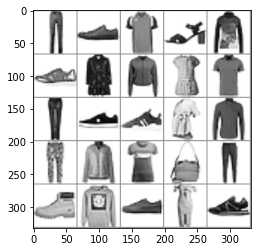

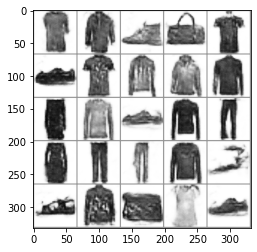

Epochs: 10 Step: 4800 Generator loss: 3.817420702278614, discriminator loss: 0.15573069086298347


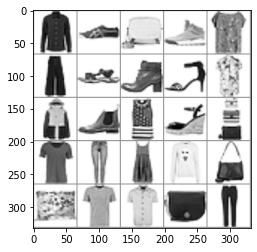

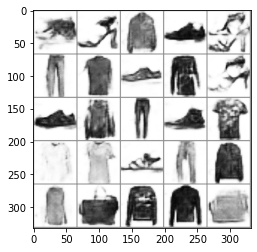

Epochs: 10 Step: 4900 Generator loss: 4.555206837654114, discriminator loss: 0.03920676789712161


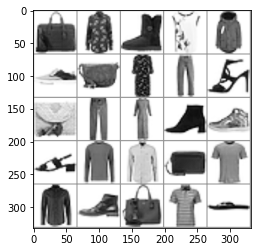

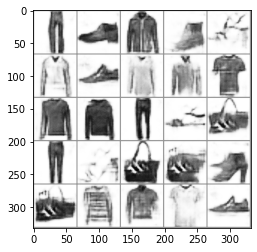

Epochs: 10 Step: 5000 Generator loss: 3.3900683103129268, discriminator loss: 0.2893776351492852


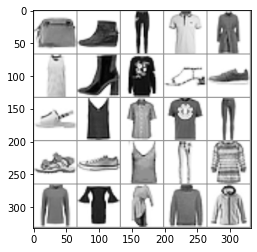

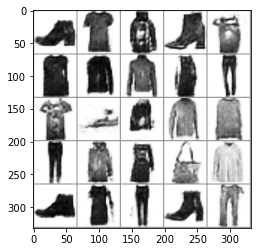

Epochs: 10 Step: 5100 Generator loss: 3.7383639180660246, discriminator loss: 0.1775824955292046


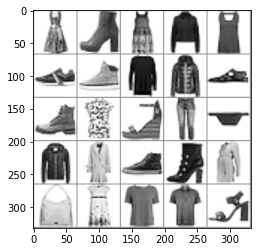

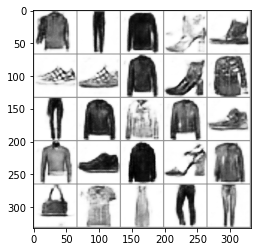

Epochs: 11 Step: 5200 Generator loss: 4.002783041000367, discriminator loss: 0.15714040560647846


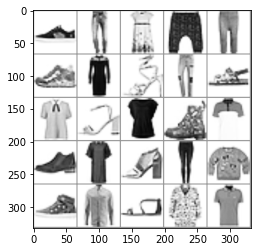

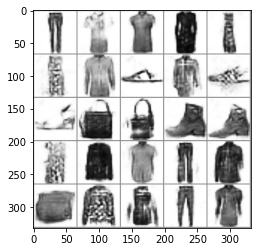

Epochs: 11 Step: 5300 Generator loss: 4.0598815414682035, discriminator loss: 0.17427994517609477


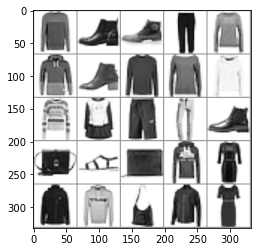

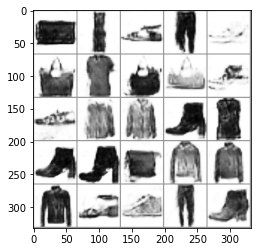

Epochs: 11 Step: 5400 Generator loss: 3.791402393579483, discriminator loss: 0.1382752456329763


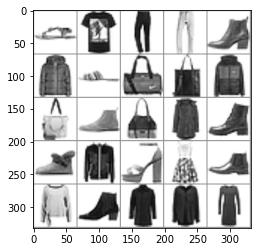

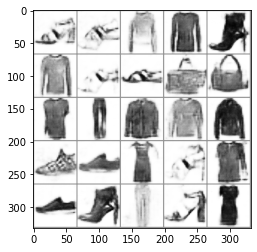

Epochs: 11 Step: 5500 Generator loss: 4.387737863063812, discriminator loss: 0.1923720663972199


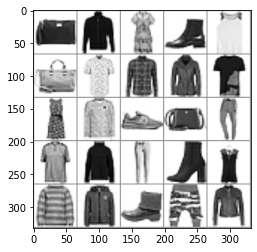

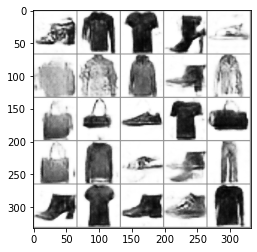

Epochs: 11 Step: 5600 Generator loss: 3.7929966458678246, discriminator loss: 0.2990573975816369


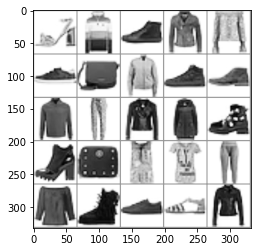

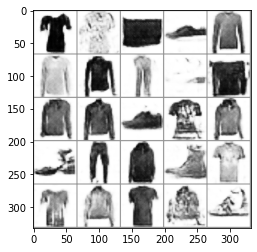

Epochs: 12 Step: 5700 Generator loss: 3.6370445728302, discriminator loss: 0.24358038444072008


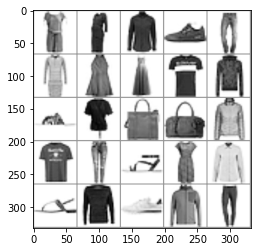

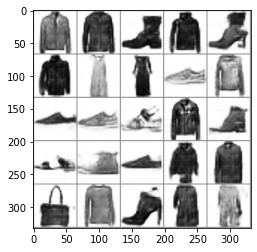

Epochs: 12 Step: 5800 Generator loss: 3.766311163902283, discriminator loss: 0.1435162771306932


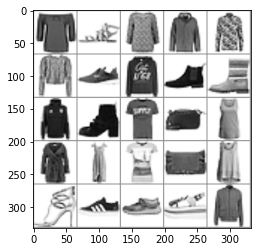

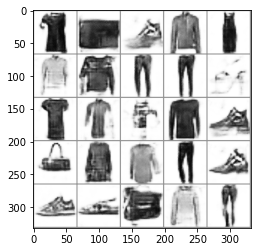

Epochs: 12 Step: 5900 Generator loss: 4.53843195438385, discriminator loss: 0.036112446896731855


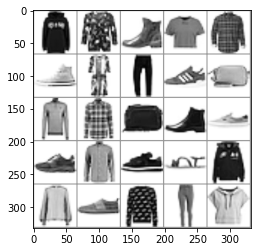

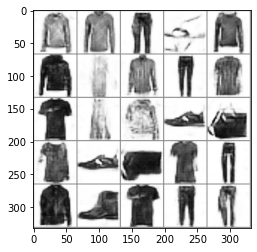

Epochs: 12 Step: 6000 Generator loss: 3.139950205683708, discriminator loss: 0.3022086855024099


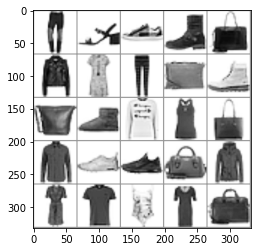

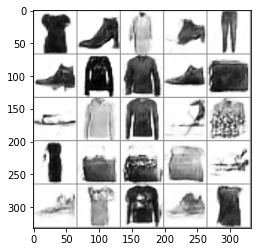

Epochs: 13 Step: 6100 Generator loss: 3.795463573932648, discriminator loss: 0.15707387702539563


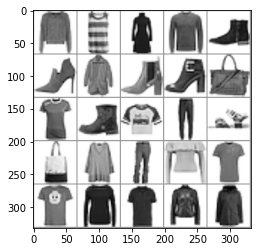

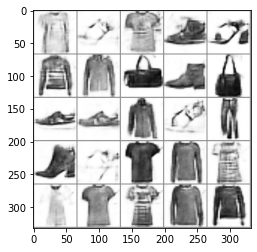

Epochs: 13 Step: 6200 Generator loss: 4.456893428657204, discriminator loss: 0.1601826713839546


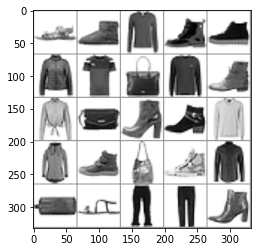

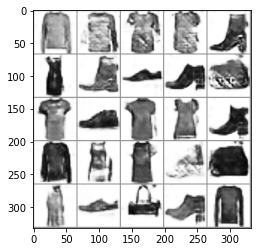

Epochs: 13 Step: 6300 Generator loss: 3.4182360875606537, discriminator loss: 0.2157910637743771


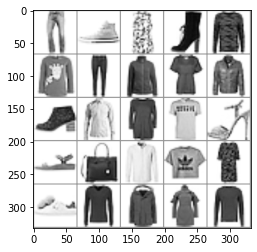

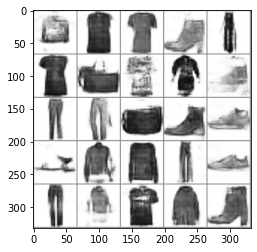

Epochs: 13 Step: 6400 Generator loss: 3.564401585608721, discriminator loss: 0.2734060399234295


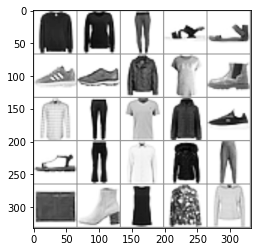

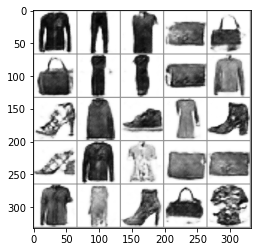

Epochs: 13 Step: 6500 Generator loss: 3.457423760890961, discriminator loss: 0.1979839392192662


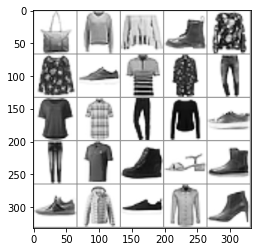

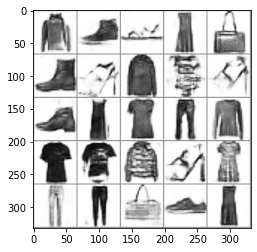

Epochs: 14 Step: 6600 Generator loss: 5.114368717670441, discriminator loss: 0.0255705974297598


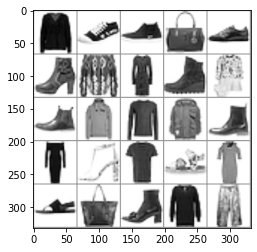

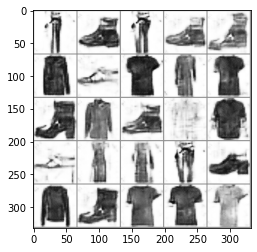

Epochs: 14 Step: 6700 Generator loss: 5.6089646530151365, discriminator loss: 0.021163508808240295


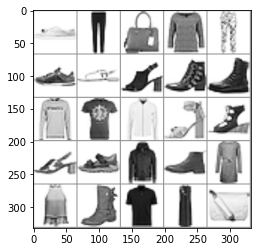

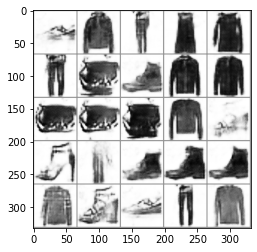

Epochs: 14 Step: 6800 Generator loss: 4.160763848721981, discriminator loss: 0.30392217594664545


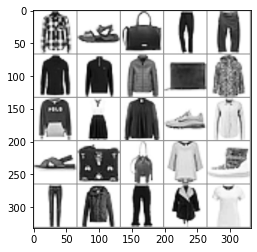

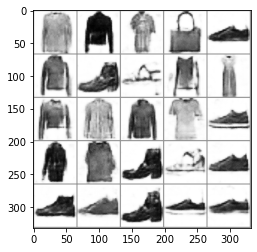

Epochs: 14 Step: 6900 Generator loss: 4.215789673924446, discriminator loss: 0.12290141526609659


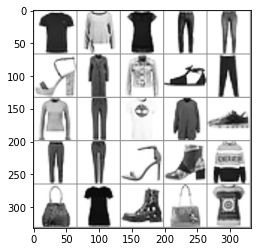

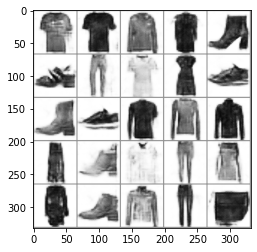

Epochs: 14 Step: 7000 Generator loss: 3.535474799871445, discriminator loss: 0.29696436539292337


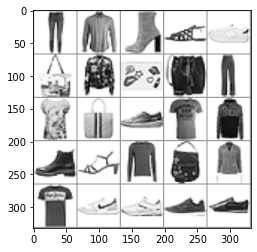

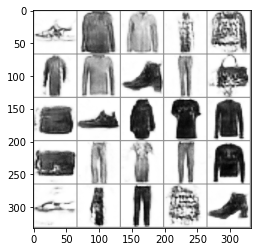

Epochs: 15 Step: 7100 Generator loss: 4.269016288146377, discriminator loss: 0.22119499142281712


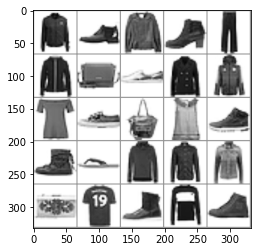

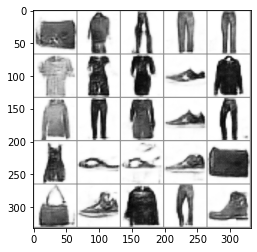

Epochs: 15 Step: 7200 Generator loss: 4.585366333136335, discriminator loss: 0.14758103103376924


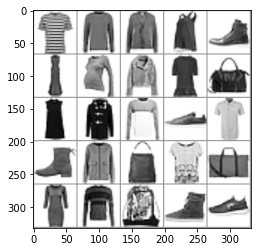

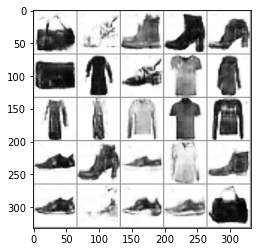

Epochs: 15 Step: 7300 Generator loss: 2.9722628235816955, discriminator loss: 0.2828008408844471


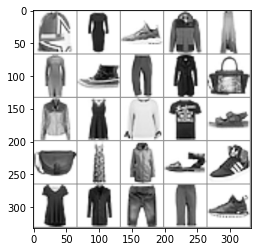

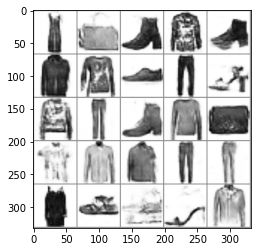

Epochs: 15 Step: 7400 Generator loss: 3.738363244533539, discriminator loss: 0.27343367371708155


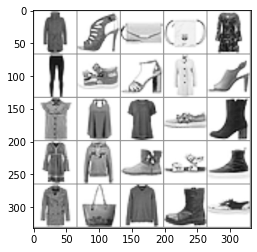

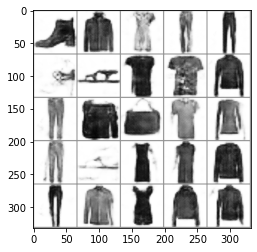

Epochs: 15 Step: 7500 Generator loss: 3.9271669889986516, discriminator loss: 0.17188097286969423


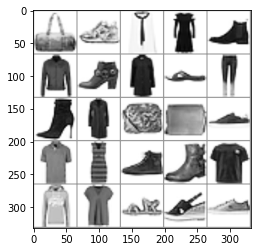

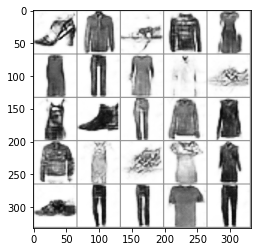

Epochs: 16 Step: 7600 Generator loss: 4.773379391431808, discriminator loss: 0.17273992130532861


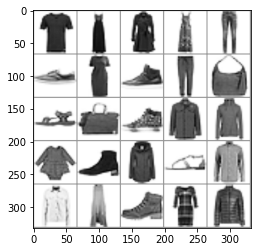

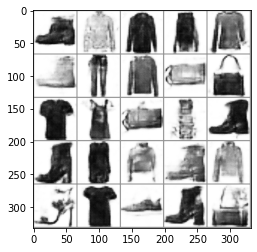

Epochs: 16 Step: 7700 Generator loss: 3.1939104092121124, discriminator loss: 0.1681413497403264


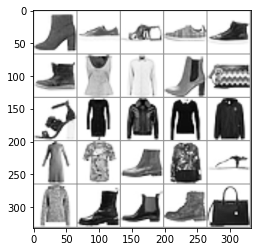

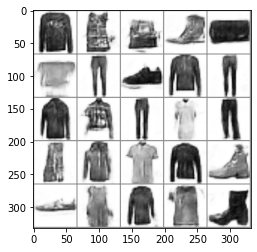

Epochs: 16 Step: 7800 Generator loss: 4.390576471090316, discriminator loss: 0.12124520431272685


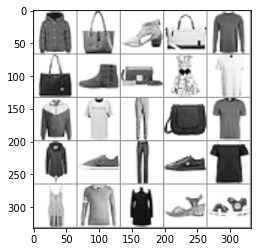

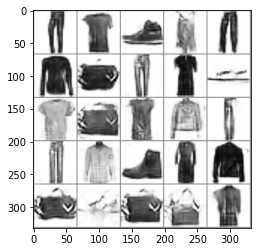

Epochs: 16 Step: 7900 Generator loss: 4.577958230674267, discriminator loss: 0.16307377674151213


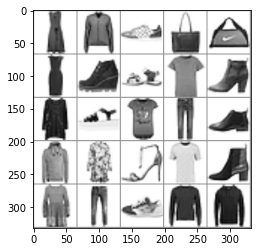

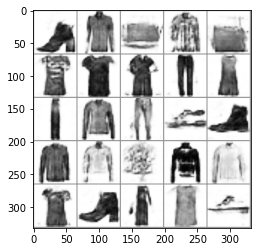

Epochs: 17 Step: 8000 Generator loss: 3.9708489668369293, discriminator loss: 0.1753404524549842


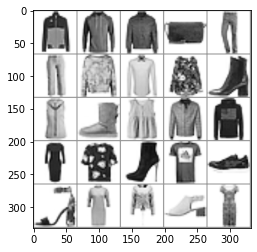

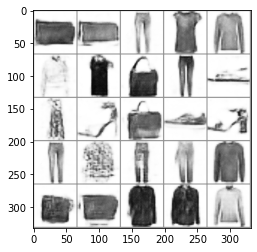

Epochs: 17 Step: 8100 Generator loss: 4.143777767419815, discriminator loss: 0.2080306279938668


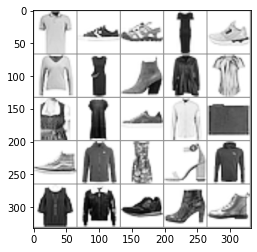

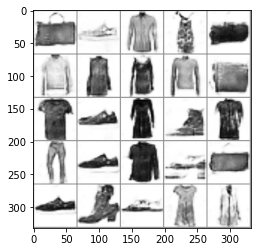

Epochs: 17 Step: 8200 Generator loss: 4.410316050052643, discriminator loss: 0.05054066205397248


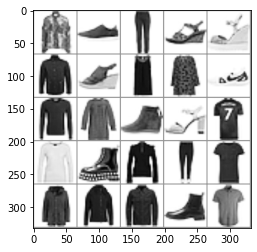

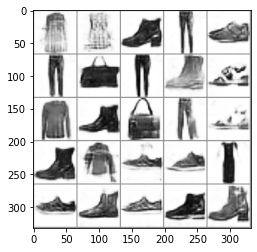

Epochs: 17 Step: 8300 Generator loss: 5.619655246734619, discriminator loss: 0.01525449079927057


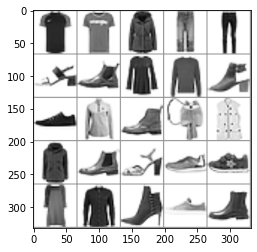

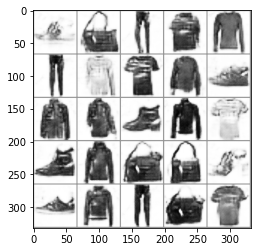

Epochs: 17 Step: 8400 Generator loss: 3.4097358560329303, discriminator loss: 0.34995992909185586


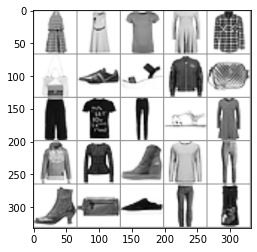

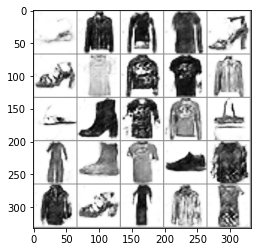

Epochs: 18 Step: 8500 Generator loss: 3.6958286321163176, discriminator loss: 0.17859183939173817


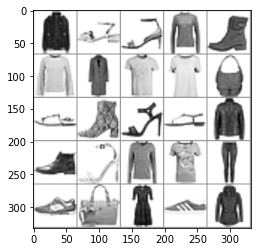

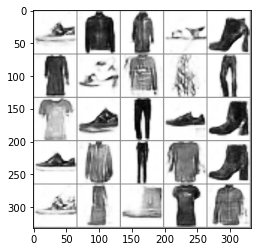

Epochs: 18 Step: 8600 Generator loss: 3.6074102795124054, discriminator loss: 0.3252046860568225


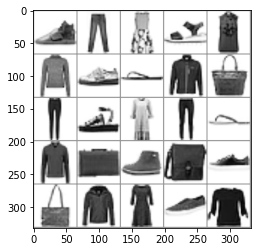

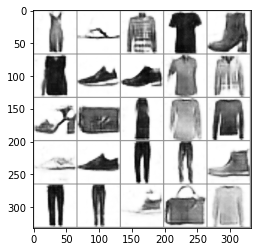

Epochs: 18 Step: 8700 Generator loss: 4.005924052000045, discriminator loss: 0.20787180736660957


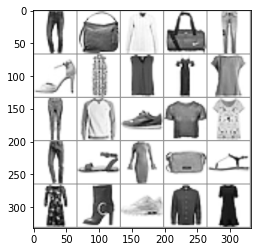

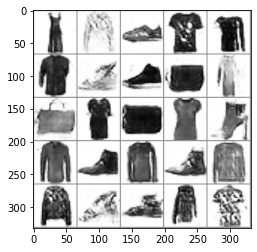

Epochs: 18 Step: 8800 Generator loss: 4.481219176054001, discriminator loss: 0.07166243759449571


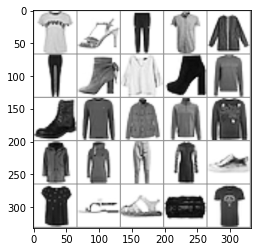

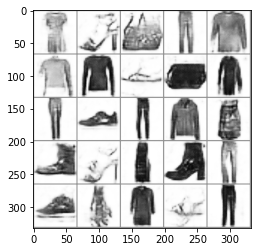

Epochs: 18 Step: 8900 Generator loss: 4.888727218675776, discriminator loss: 0.1841121571091935


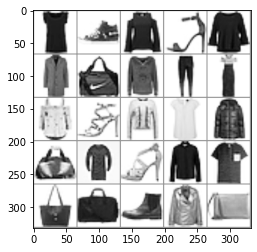

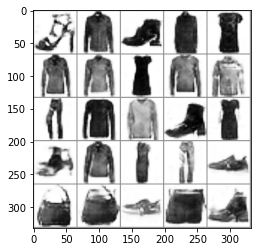

Epochs: 19 Step: 9000 Generator loss: 3.1871643698215486, discriminator loss: 0.17098102845251562


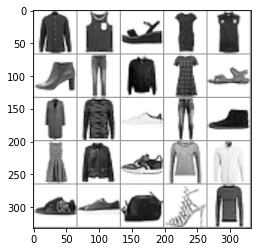

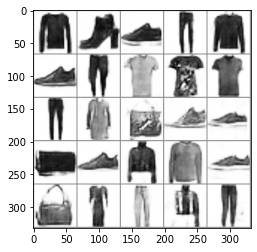

Epochs: 19 Step: 9100 Generator loss: 4.524248007535935, discriminator loss: 0.18118023494258523


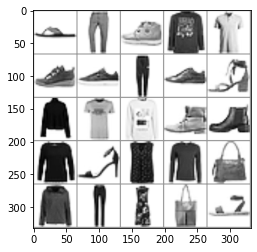

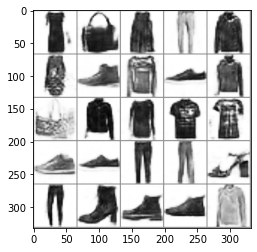

Epochs: 19 Step: 9200 Generator loss: 5.1848840284347535, discriminator loss: 0.024742748169228435


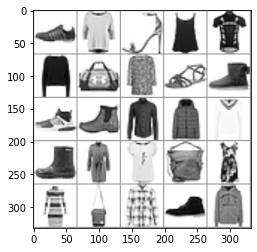

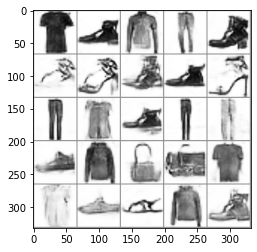

Epochs: 19 Step: 9300 Generator loss: 5.786697163581848, discriminator loss: 0.09349601318361238


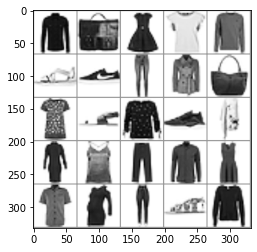

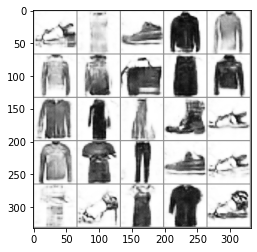

Epochs: 20 Step: 9400 Generator loss: 3.2498212563991546, discriminator loss: 0.2089840877056122


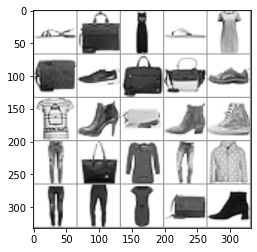

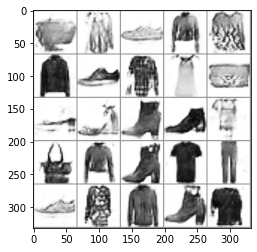

Epochs: 20 Step: 9500 Generator loss: 3.67566773891449, discriminator loss: 0.12074416754767299


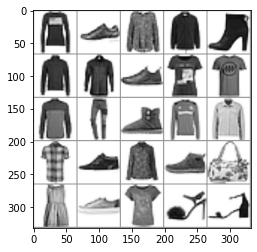

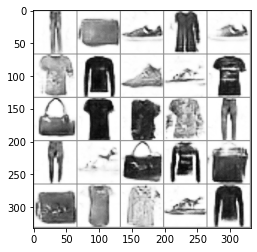

Epochs: 20 Step: 9600 Generator loss: 4.251424092799425, discriminator loss: 0.16850566621869803


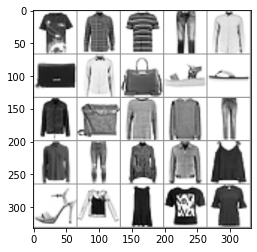

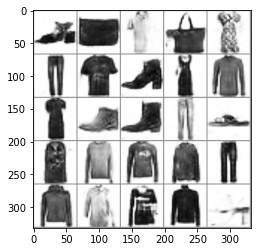

Epochs: 20 Step: 9700 Generator loss: 3.806963051557541, discriminator loss: 0.1938428882136941


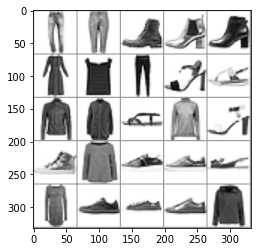

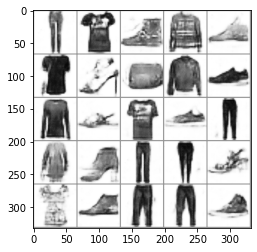

Epochs: 20 Step: 9800 Generator loss: 4.125069388151169, discriminator loss: 0.24235068533569573


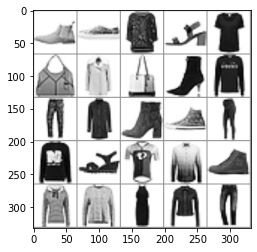

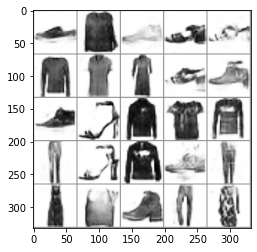

Epochs: 21 Step: 9900 Generator loss: 4.644327987432479, discriminator loss: 0.06273154325783253


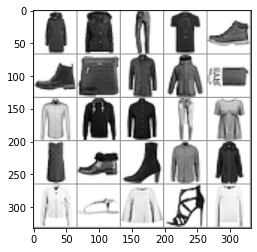

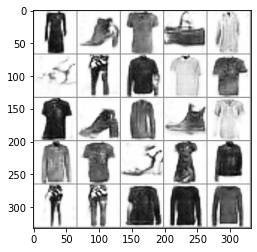

Epochs: 21 Step: 10000 Generator loss: 4.158234764481895, discriminator loss: 0.24720515429973602


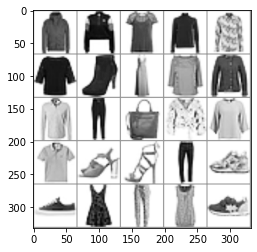

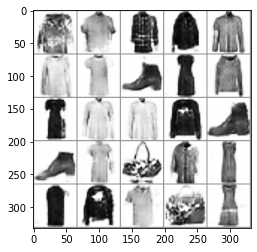

Epochs: 21 Step: 10100 Generator loss: 3.694392288327217, discriminator loss: 0.1859930699504912


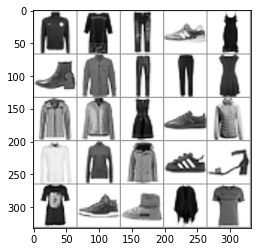

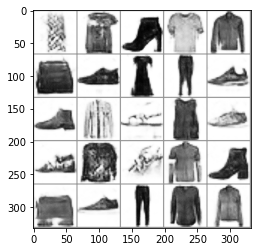

Epochs: 21 Step: 10200 Generator loss: 4.719027227433398, discriminator loss: 0.06629211482591928


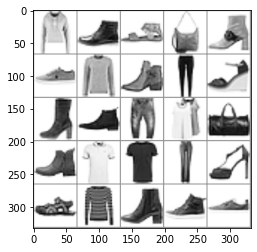

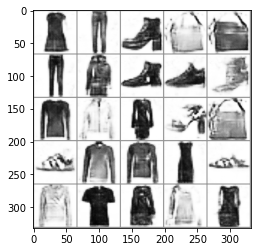

Epochs: 21 Step: 10300 Generator loss: 3.4076613879203794, discriminator loss: 0.3185408587753773


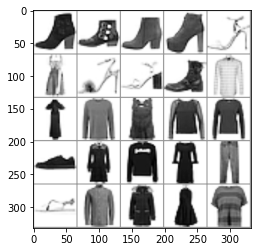

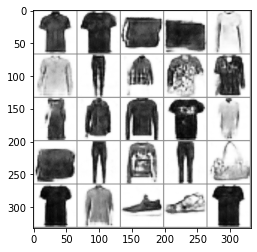

Epochs: 22 Step: 10400 Generator loss: 4.006537109613419, discriminator loss: 0.21851732397451998


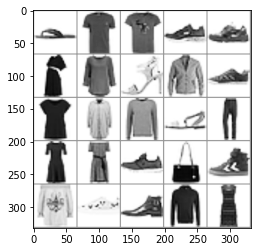

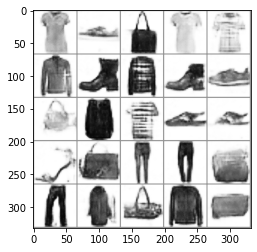

Epochs: 22 Step: 10500 Generator loss: 4.438412328958512, discriminator loss: 0.13970051693730057


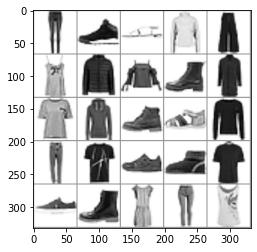

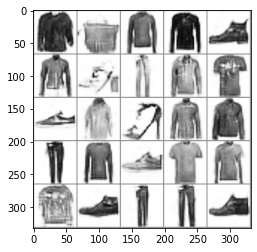

Epochs: 22 Step: 10600 Generator loss: 5.322327780723572, discriminator loss: 0.01877004275098443


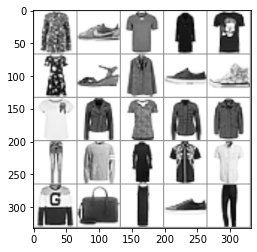

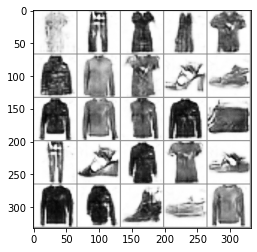

Epochs: 22 Step: 10700 Generator loss: 4.715783257200383, discriminator loss: 0.16512859669514002


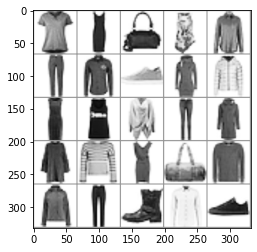

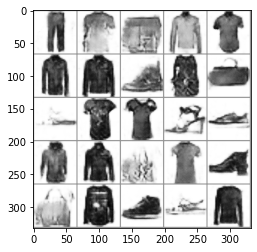

Epochs: 23 Step: 10800 Generator loss: 3.80160155415535, discriminator loss: 0.19386994644999503


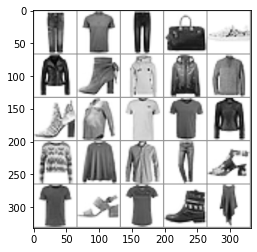

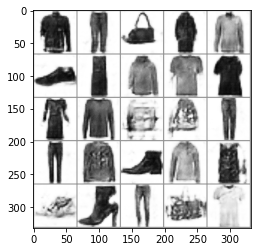

Epochs: 23 Step: 10900 Generator loss: 4.634444586187601, discriminator loss: 0.15457677049562335


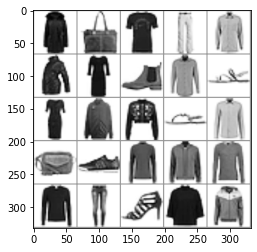

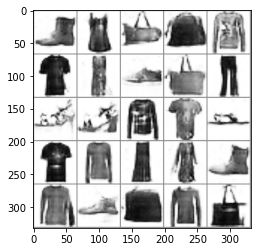

Epochs: 23 Step: 11000 Generator loss: 4.217919343709946, discriminator loss: 0.10852166144177318


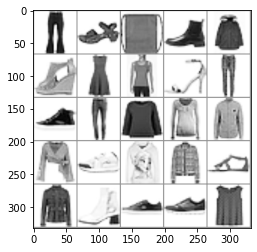

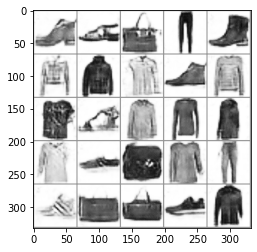

Epochs: 23 Step: 11100 Generator loss: 4.2025603723526, discriminator loss: 0.145721271969378


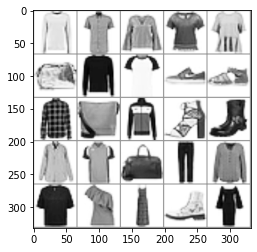

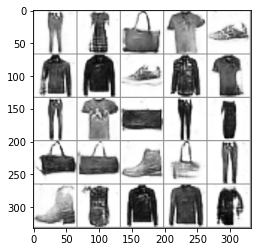

Epochs: 23 Step: 11200 Generator loss: 4.563141345381736, discriminator loss: 0.13500188930891455


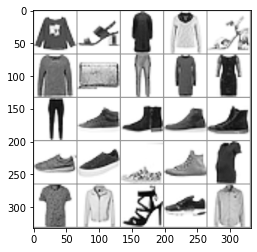

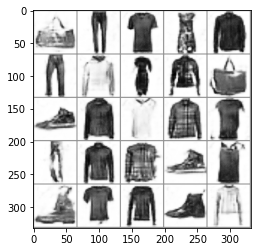

Epochs: 24 Step: 11300 Generator loss: 5.750451991558075, discriminator loss: 0.016515478761866688


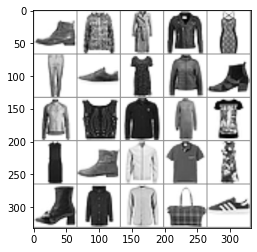

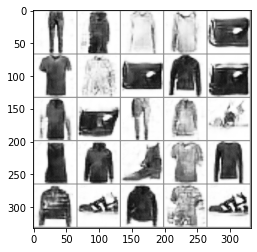

Epochs: 24 Step: 11400 Generator loss: 3.864595880508423, discriminator loss: 0.2794453565077856


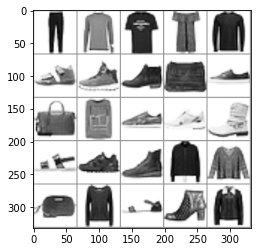

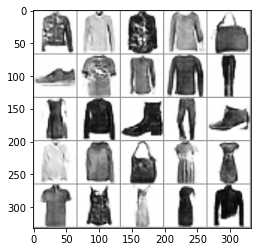

Epochs: 24 Step: 11500 Generator loss: 3.680972767472267, discriminator loss: 0.2074813438951969


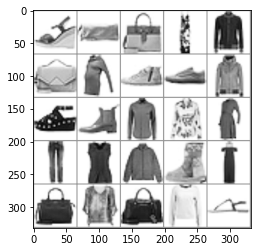

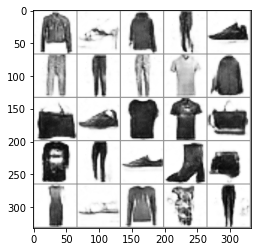

KeyboardInterrupt: 

In [12]:
current_step = 0
gen_losses = 0
disc_losses = 0
os.makedirs("CGAN", exist_ok=True)

for epoch in range(n_epochs):
    for real, labels in(dataloader):
        real_imgs = Variable(real.type(torch.FloatTensor)).to(device)
        labels = Variable(labels.type(torch.LongTensor)).to(device)
        
        disc_opt.zero_grad()
        fake_noise = get_noise(len(real), z_dim)
        fake_labels = Variable(torch.LongTensor(np.random.randint(0, 10, len(real)))).to(device)
        fake = gen(fake_noise, fake_labels)
        # detach to remove generator to prevent error backpropagation to generator
        disc_preds_fake = disc(fake.detach(), fake_labels).reshape(-1) 
        disc_fake_loss = criterion(disc_preds_fake, torch.zeros_like(disc_preds_fake))
        disc_preds_real = disc(real_imgs, labels).reshape(-1)
        disc_real_loss = criterion(disc_preds_real, torch.ones_like(disc_preds_real))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph = True)
        disc_opt.step()
        disc_losses += disc_loss.item()

        gen_opt.zero_grad()
        fake_noise_2 = get_noise(len(real), z_dim)
        fake_labels_2 = Variable(torch.LongTensor(np.random.randint(0, 10, len(real)))).to(device)
        fake_2 = gen(fake_noise_2, fake_labels_2)
        disc_preds_fake = disc(fake_2, fake_labels_2).reshape(-1)
        gen_loss = criterion(disc_preds_fake, torch.ones_like(disc_preds_fake))
        gen_loss.backward()
        gen_opt.step()
        gen_losses += gen_loss.item()
        
        if current_step % steps == 0 and current_step > 0 :
            print(f"Epochs: {epoch} Step: {current_step} Generator loss: {gen_losses / steps}, discriminator loss: {disc_losses / steps}")
            img_grid_real = torchvision.utils.make_grid(real[:25], nrow = 5)
            img_grid_fake = torchvision.utils.make_grid(fake[:25], nrow = 5)
            save_image(fake_2.data[:36], "CGAN/%d.png" % current_step, nrow=6, normalize=True)
            matplotlib_imshow(img_grid_real, one_channel=True)
            matplotlib_imshow(img_grid_fake,  one_channel=True)
            gen_losses = 0
            disc_losses = 0
        
        current_step += 1